In [1]:
import os
os.getcwd()

'C:\\Users\\Admin\\Documents\\Model\\BiSeNetV3'

In [2]:
import os
from PIL import Image
from collections import Counter

# Define the folder paths
path = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256'
source_ori = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256\\prep_ori'
source_gt = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256\\prep_gt'

def analyze_images(folder_path):
    total_images = 0
    total_size = [0, 0]  # Width, Height
    total_pixels = 0
    color_modes = []
    file_formats = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            total_images += 1
            img_path = os.path.join(folder_path, filename)
            with Image.open(img_path) as img:
                width, height = img.size
                total_size[0] += width
                total_size[1] += height
                total_pixels += width * height
                color_modes.append(img.mode)
                file_formats.append(img.format)

    # Calculate average size
    if total_images > 0:
        avg_size = (total_size[0] // total_images, total_size[1] // total_images)
        avg_total_pixels = total_pixels / total_images
        most_common_color_mode = Counter(color_modes).most_common(1)[0][0]
        most_common_format = Counter(file_formats).most_common(1)[0][0]
    else:
        avg_size = (0, 0)
        avg_total_pixels = 0
        most_common_color_mode = None
        most_common_format = None

    return {
        "Total Gambar": total_images,
        "Rata-rata Ukuran Gambar": avg_size,
        "Rata-rata Total Piksel": avg_total_pixels,
        "Mode Warna Paling Sering": most_common_color_mode,
        "Format File": most_common_format
    }

# Analyze both folders
results = {
    "Original": analyze_images(source_ori),
    "Ground Truth": analyze_images(source_gt)
}

# Display results
for folder_name, info in results.items():
    print(f"Hasil Analisis untuk Folder {folder_name}:")
    print(f"Total Gambar: {info['Total Gambar']}")
    print(f"Rata-rata Ukuran Gambar: ({info['Rata-rata Ukuran Gambar'][0]:.2f} x {info['Rata-rata Ukuran Gambar'][1]:.2f})")
    print(f"Rata-rata Total Piksel: {info['Rata-rata Total Piksel']:.2f}")
    print(f"Mode Warna Paling Sering: {info['Mode Warna Paling Sering']}")
    print(f"Format File: {info['Format File']}\n")

# Ensure that the number of images in the Original and Ground Truth folders is the same
assert results["Original"]["Total Gambar"] == results["Ground Truth"]["Total Gambar"], "Jumlah gambar di folder ORI dan GT tidak sama"

# Ensure that the average image size in both folders is the same
assert results["Original"]["Rata-rata Ukuran Gambar"] == results["Ground Truth"]["Rata-rata Ukuran Gambar"], "Rata-rata ukuran gambar di folder ORI dan GT tidak sama"

# Ensure that the average total pixels in both folders are the same
assert results["Original"]["Rata-rata Total Piksel"] == results["Ground Truth"]["Rata-rata Total Piksel"], "Rata-rata total piksel di folder ORI dan GT tidak sama"

# Ensure that the most common color mode in both folders is the same
assert results["Original"]["Mode Warna Paling Sering"] == results["Ground Truth"]["Mode Warna Paling Sering"], "Mode warna paling sering di folder ORI dan GT tidak sama"

# Ensure that the file formats in both folders are the same
assert results["Original"]["Format File"] == results["Ground Truth"]["Format File"], "Format file di folder ORI dan GT tidak sama"

print("\nSemua pengujian berhasil! Folder original dan ground_truth memiliki data gambar yang sama.")

Hasil Analisis untuk Folder Original:
Total Gambar: 112
Rata-rata Ukuran Gambar: (256.00 x 256.00)
Rata-rata Total Piksel: 65536.00
Mode Warna Paling Sering: RGB
Format File: PNG

Hasil Analisis untuk Folder Ground Truth:
Total Gambar: 112
Rata-rata Ukuran Gambar: (256.00 x 256.00)
Rata-rata Total Piksel: 65536.00
Mode Warna Paling Sering: RGB
Format File: PNG


Semua pengujian berhasil! Folder original dan ground_truth memiliki data gambar yang sama.


# Split Data

In [3]:
from sklearn.model_selection import train_test_split
import shutil

# Folder tujuan untuk train, validation, dan test di bawah base
train_dir = path + '\\split\\original\\train'
val_dir = path + '\\split\\original\\val'
test_dir = path + '\\split\\original\\test'

# Membuat folder untuk train, validation, dan test
os.makedirs(os.path.join(train_dir, 'original'), exist_ok=True)
os.makedirs(os.path.join(train_dir, 'ground_truth'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'original'), exist_ok=True)
os.makedirs(os.path.join(val_dir, 'ground_truth'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'original'), exist_ok=True)
os.makedirs(os.path.join(test_dir, 'ground_truth'), exist_ok=True)


# Mendapatkan semua file gambar dan mask
original_files = sorted(os.listdir(source_ori))
ground_truth_files = sorted(os.listdir(source_gt))

# Pengecekan apakah jumlah file gambar dan mask sama
if len(original_files) != len(ground_truth_files):
    print(f"WARNING: Jumlah gambar asli ({len(original_files)}) tidak sama dengan jumlah mask ({len(ground_truth_files)})")
else:
    print(f"Jumlah gambar dan mask sesuai: {len(original_files)} file")

# Rasio pembagian dataset
train_ratio = 0.8  # 80% untuk train
val_ratio = 0.1    # 10% untuk validation
test_ratio = 0.1   # 10% untuk test

# Pastikan rasio totalnya 1.0
if (train_ratio + val_ratio + test_ratio) != 1.0:
    raise ValueError("Rasio train, validation, dan test harus berjumlah 1.0")

# Membagi dataset menjadi train, val, test
train_original, temp_original, train_ground_truth, temp_ground_truth = train_test_split(
    original_files, ground_truth_files, test_size=(1.0 - train_ratio), random_state=42)

val_size = val_ratio / (val_ratio + test_ratio)  # Menghitung rasio validasi terhadap (validasi + test)

val_original, test_original, val_ground_truth, test_ground_truth = train_test_split(
    temp_original, temp_ground_truth, test_size=(1.0 - val_size), random_state=42)

# Fungsi untuk menyalin file ke direktori yang tepat
def copy_files(original_list, ground_truth_list, folder):
    if not original_list or not ground_truth_list:
        print(f"ERROR: Tidak ada file untuk diproses di {folder}")
        return

    for orig, gt in zip(original_list, ground_truth_list):
        shutil.copy(os.path.join(source_ori, orig), os.path.join(folder, 'original', orig))
        shutil.copy(os.path.join(source_gt, gt), os.path.join(folder, 'ground_truth', gt))

    print(f"{len(original_list)} file berhasil disalin ke {folder}")

# Menyalin file ke folder masing-masing
copy_files(train_original, train_ground_truth, train_dir)
copy_files(val_original, val_ground_truth, val_dir)
copy_files(test_original, test_ground_truth, test_dir)

Jumlah gambar dan mask sesuai: 112 file
89 file berhasil disalin ke C:\Users\Admin\Documents\SKRIPSI\DATASET\PREPROCESSING\256\split\original\train
11 file berhasil disalin ke C:\Users\Admin\Documents\SKRIPSI\DATASET\PREPROCESSING\256\split\original\val
12 file berhasil disalin ke C:\Users\Admin\Documents\SKRIPSI\DATASET\PREPROCESSING\256\split\original\test


# One Hot Encoding

Train Shapes:
X_train: (89, 256, 256, 3)
y_train: (89, 256, 256, 3)

Validation Shapes:
X_val: (11, 256, 256, 3)
y_val: (11, 256, 256, 3)

Class Information and Hex Color Codes:
Class 0: #ff0000
Class 2: #00ff00
Class 1: #0000ff
Unique classes in one_hot_visual: [0 1 2]


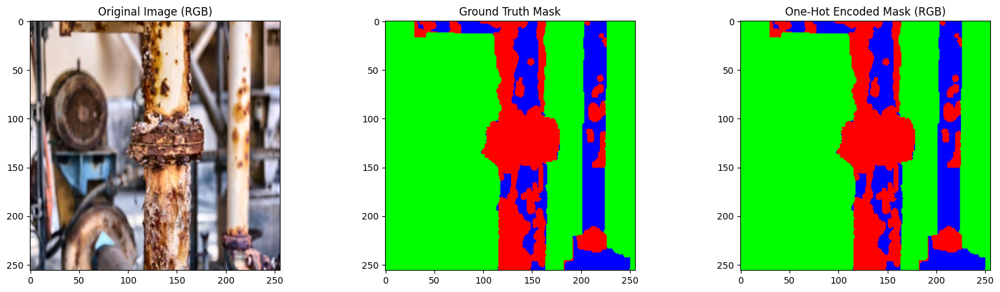

Unique classes in one_hot_visual: [1 2]


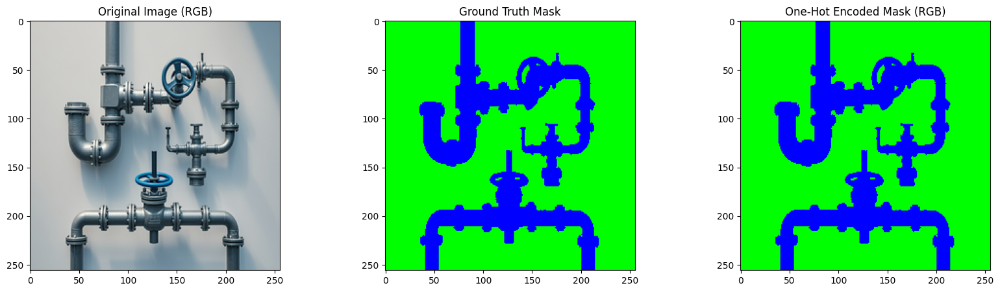

In [4]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Convert RGB to HEX color codes
def rgb_to_hex(rgb):
    """Convert RGB to HEX color code."""
    return "#{:02x}{:02x}{:02x}".format(rgb[0], rgb[1], rgb[2])

# Encode the mask image into class indices
def encode_mask(mask_image, tolerance=3):
    """Encode the mask based on RGB values into class labels."""
    # Replace black background with green (assuming black is not a valid class)
    mask_image[np.all(mask_image == [0, 0, 0], axis=-1)] = [0, 255, 0]

    # Initialize encoded mask
    encoded_mask = np.zeros((mask_image.shape[0], mask_image.shape[1]), dtype=np.uint8)

    # Define class masks based on RGB color values with tolerance
    red_mask = np.all(np.abs(mask_image - [255, 0, 0]) <= tolerance, axis=-1)
    encoded_mask[red_mask] = 0

    green_mask = np.all(np.abs(mask_image - [0, 255, 0]) <= tolerance, axis=-1)
    encoded_mask[green_mask] = 2

    blue_mask = np.all(np.abs(mask_image - [0, 0, 255]) <= tolerance, axis=-1)
    encoded_mask[blue_mask] = 1

    return encoded_mask

# One-hot encode the encoded mask
def one_hot_encode(encoded_mask, num_classes=3):
    """Convert the encoded mask into a one-hot encoded mask."""
    one_hot_mask = np.eye(num_classes)[encoded_mask]
    return one_hot_mask

# Load images and masks, then apply encoding and resizing
def load_and_one_hot_encode(original_dir, mask_dir, target_size=None):
    """Load images and masks, resize them, and apply one-hot encoding."""
    images = []
    masks = []
    one_hot_masks = []

    image_files = sorted(os.listdir(original_dir))
    mask_files = sorted(os.listdir(mask_dir))

    for img_file, mask_file in zip(image_files, mask_files):
        # Read images and convert to RGB
        img = cv2.cvtColor(cv2.imread(os.path.join(original_dir, img_file)), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(os.path.join(mask_dir, mask_file)), cv2.COLOR_BGR2RGB)

        # Resize if target_size is specified
        if target_size is not None:
            img = cv2.resize(img, target_size)
            mask = cv2.resize(mask, target_size)

        # Ensure the image and mask have the same dimensions
        if img.shape[:2] == mask.shape[:2]:
            images.append(img)
            masks.append(mask)

            # Encode the mask and apply one-hot encoding
            encoded_mask = encode_mask(mask)
            one_hot_mask = one_hot_encode(encoded_mask)
            one_hot_masks.append(one_hot_mask)
        else:
            print(f"Size mismatch for {img_file} ({img.shape}) and {mask_file} ({mask.shape}). Skipping...")

    images = np.array(images)
    masks = np.array(masks)
    one_hot_masks = np.array(one_hot_masks)

    return images, masks, one_hot_masks

# Convert one-hot encoded mask to an RGB image for visualization
def convert_to_rgb(one_hot_visual, colormap):
    """Convert one-hot encoded mask to an RGB image for visualization."""
    shape = one_hot_visual.shape
    rgb_image = np.zeros((shape[0], shape[1], 3), dtype=np.uint8)

    # Map each class index to its corresponding color
    for class_index, color in colormap.items():
        rgb_image[one_hot_visual == class_index] = color

    return rgb_image

# Visualize original image, ground truth mask, one-hot mask, and the RGB-encoded mask
def visualize_sample(image, mask, one_hot_mask, colormap):
    """Visualize the original image, mask, one-hot encoded mask, and RGB encoded mask."""
    plt.figure(figsize=(20, 5))

    one_hot_visual = np.argmax(one_hot_mask, axis=-1)

    # Debugging output to check the unique classes
    print("Unique classes in one_hot_visual:", np.unique(one_hot_visual))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title('Original Image (RGB)')

    plt.subplot(1, 3, 2)
    plt.imshow(mask)
    plt.title('Ground Truth Mask')

    plt.subplot(1, 3, 3)
    rgb_encoded_mask = convert_to_rgb(one_hot_visual, colormap)
    plt.imshow(rgb_encoded_mask)
    plt.title('One-Hot Encoded Mask (RGB)')
    plt.show()

# Define directories for training, validation, and test data
base_split = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\DATASET\\PREPROCESSING\\256\\split\\original'
train_original_dir = os.path.join(base_split, "train", "original")
train_mask_dir = os.path.join(base_split, "train", "ground_truth")
val_original_dir = os.path.join(base_split, "val", "original")
val_mask_dir = os.path.join(base_split, "val", "ground_truth")
test_original_dir = os.path.join(base_split, "test", "original")
test_mask_dir = os.path.join(base_split, "test", "ground_truth")

target_size = (256, 256)

# Load and one-hot encode training and validation sets
train_images, train_masks, train_one_hot_masks = load_and_one_hot_encode(train_original_dir, train_mask_dir, target_size)
val_images, val_masks, val_one_hot_masks = load_and_one_hot_encode(val_original_dir, val_mask_dir, target_size)

# Assign data to training and validation sets
X_train = train_images
y_train = train_one_hot_masks

X_val = val_images
y_val = val_one_hot_masks

# Test set (loading only the paths, loading the images should be done similarly as train/val if needed)
X_test = test_original_dir
y_test = test_mask_dir

# Print shapes of the datasets for verification
print("Train Shapes:")
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)

print("\nValidation Shapes:")
print("X_val:", X_val.shape)
print("y_val:", y_val.shape)

# Define colormap for each class index
colormap = {
    0: [255, 0, 0],    # Red
    2: [0, 255, 0],    # Green
    1: [0, 0, 255],    # Blue
}
# Print class information and hex color codes
print("\nClass Information and Hex Color Codes:")
for class_index, color in colormap.items():
    hex_color = rgb_to_hex(color)
    print(f'Class {class_index}: {hex_color}')

# Visualize a sample from the training set
index = 2  # Change this to visualize other samples
visualize_sample(X_train[index], train_masks[index], y_train[index], colormap)

# Visualize a sample from the validation set
index_val = 10  # Change this to visualize other samples
visualize_sample(X_val[index_val], val_masks[index_val], y_val[index_val], colormap)

# Model Arsitektur

In [5]:
# BiSeNetV3 + EfficientNetB1

import tensorflow as tf
from tensorflow.keras.layers import (Conv2D, BatchNormalization, ReLU,
                                     GlobalAveragePooling2D, Reshape, Multiply,
                                     Add, Input, Concatenate, Conv2DTranspose)
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB1

# Squeeze-and-Excitation Block (tidak berubah)
def se_block(x, reduction_ratio=16):
    filters = x.shape[-1]
    se = GlobalAveragePooling2D()(x)
    se = Reshape((1, 1, filters))(se)
    se = Conv2D(filters // reduction_ratio, 1, activation='relu')(se)
    se = Conv2D(filters, 1, activation='sigmoid')(se)
    return Multiply()([x, se])

# Adaptive Receptive Field Block
def adaptive_rf_block(x, filters):
    # Dilated convolutions for adaptive receptive fields
    dilate1 = Conv2D(filters, 3, padding='same', dilation_rate=1, activation='relu')(x)
    dilate2 = Conv2D(filters, 3, padding='same', dilation_rate=2, activation='relu')(x)
    dilate3 = Conv2D(filters, 3, padding='same', dilation_rate=4, activation='relu')(x)
    return Add()([dilate1, dilate2, dilate3])

# Detail Branch (sama seperti di BiSeNetV2)
def detail_branch(input_tensor):
    x = Conv2D(64, 3, 2, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    x = Conv2D(64, 3, 1, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Stage 2
    x = Conv2D(128, 3, 2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)
    for _ in range(2):
        x_res = Conv2D(128, 3, 1, padding='same')(x)
        x_res = BatchNormalization()(x_res)
        x_res = ReLU()(x_res)
        x_res = Conv2D(128, 3, 1, padding='same')(x_res)
        x_res = BatchNormalization()(x_res)
        x = Add()([x, x_res])
        x = ReLU()(x)
    return x

# Semantic Branch with Context Embedding
def semantic_branch(input_tensor):
    # Use EfficientNetB1 as the backbone
    base_model = EfficientNetB1(weights='imagenet', include_top=False, input_tensor=input_tensor)

    # Extract features from a specific layer
    x = base_model.get_layer("block6a_expand_activation").output  # Layer EfficientNetB1
    x = Conv2D(128, 1, padding='same')(x)  # Channel reduction
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Context embedding
    x = adaptive_rf_block(x, filters=128)
    x = se_block(x)  # SE block for feature enhancement
    return x

# Feature Fusion Module (FFM)
def feature_fusion(detail, semantic):
    # Apply detail guidance
    detail_guidance = Conv2D(128, 3, padding='same')(detail)
    detail_guidance = BatchNormalization()(detail_guidance)
    detail_guidance = ReLU()(detail_guidance)

    # Upsample semantic branch output
    semantic = Conv2DTranspose(128, (4, 4), strides=(4, 4), padding='same')(semantic)
    semantic_guidance = Conv2D(128, 3, padding='same')(semantic)
    semantic_guidance = BatchNormalization()(semantic_guidance)
    semantic_guidance = ReLU()(semantic_guidance)

    # Concatenate and apply attention mechanism
    fusion = Concatenate()([detail_guidance, semantic_guidance])
    fusion = Conv2D(128, 3, padding='same')(fusion)
    fusion = BatchNormalization()(fusion)
    fusion = ReLU()(fusion)

    fusion = se_block(fusion)  # Adding SE block to refine features
    return fusion

# Create BiSeNetV3 Model with EfficientNetB1 backbone
def create_bisenetv3(input_shape=(256, 256, 3), num_classes=3):
    inputs = Input(shape=input_shape)

    # Detail Branch
    detail = detail_branch(inputs)

    # Semantic Branch
    semantic = semantic_branch(inputs)

    # Feature Fusion
    x = feature_fusion(detail, semantic)

    # Final layers with transpose convolution for upsampling
    x = Conv2D(128, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Upsample output to match input size
    x = Conv2DTranspose(num_classes, (4, 4), strides=(4, 4), padding='same', activation='softmax')(x)

    # Create model
    model = Model(inputs=inputs, outputs=x, name="BiSeNetV3_EfficientNetB1")
    return model

# Create the model
model = create_bisenetv3(input_shape=(256, 256, 3))
model.summary()

Model: "BiSeNetV3_EfficientNetB1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 256, 256, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling (Rescaling)         │ (None, 256, 256, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ normalization (Normalization) │ (None, 256, 256, 3)       │               7 │ rescaling[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling_1 (Rescaling)       │ (None, 256, 256, 3)       │               0 │ normalization[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv_pad (ZeroPadding2D) │ (None, 257, 257, 3)       │               0 │ rescaling_1[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv (Conv2D)            │ (None, 128, 128, 32)      │             864 │ stem_conv_pad[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn (BatchNormalization)  │ (None, 128, 128, 32)      │             128 │ stem_conv[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_activation (Activation)  │ (None, 128, 128, 32)      │               0 │ stem_bn[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_dwconv                │ (None, 128, 128, 32)      │             288 │ stem_activation[0][0]      │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_bn                    │ (None, 128, 128, 32)      │             128 │ block1a_dwconv[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_activation            │ (None, 128, 128, 32)      │               0 │ block1a_bn[0][0]           │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_squeeze            │ (None, 32)                │               0 │ block1a_activation[0][0]   │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reshape (Reshape)  │ (None, 1, 1, 32)          │               0 │ block1a_se_squeeze[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reduce (Conv2D)    │ (None, 1, 1, 8)           │             264 │ block1a_se_reshape[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_expand (Conv2D)    │ (None, 1, 1, 32)          │             288 │ block1a_se_reduce[0][0]    │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 3,554,750 (13.56 MB)

 Trainable params: 3,527,703 (13.46 MB)

 Non-trainable params: 27,047 (105.66 KB)

In [6]:
# Menampilkan Visual Arsitektur Model
from tensorflow.keras.utils import plot_model

# Path ke folder output
architecture = 'C:\\Users\\Admin\\Documents\\SKRIPSI\\Kode\\Model\\BiSeNetV3\\Architecture'
os.makedirs(architecture, exist_ok=True)

# Misalnya, model adalah nama variabel yang berisi arsitektur model Keras
plot_model(model, to_file='C:\\Users\\Admin\\Documents\\SKRIPSI\\Kode\\Model\\BiSeNetV3\\Architecture\\BiSeNetV3_EfficientNetB1_256.png', show_shapes=True, show_layer_names=True)

# Train Model

Epoch 1/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.5066 - loss: 1.0017   
Epoch 1: saving model to .//model//256O_B8E100_BiSeNetV3-EfficientNetB1.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 90s 5s/step - accuracy: 0.5144 - loss: 0.9947 - val_accuracy: 0.6188 - val_loss: 1.0647 - learning_rate: 0.0010
Epoch 2/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7734 - loss: 0.6526 
Epoch 2: saving model to .//model//256O_B8E100_BiSeNetV3-EfficientNetB1.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 53s 4s/step - accuracy: 0.7731 - loss: 0.6512 - val_accuracy: 0.2720 - val_loss: 8.0842 - learning_rate: 0.0010
Epoch 3/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7967 - loss: 0.5189 
Epoch 3: saving model to .//model//256O_B8E100_BiSeNetV3-EfficientNetB1.keras
12/12 ━━━━━━━━━━━━━━━━━━━━ 49s 4s/step - accuracy: 0.7967 - loss: 0.5192 - val_accuracy: 0.4795 - val_loss: 3.1736 - learning_rate: 0.0010
Epoch 4/100
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8429 - loss: 0.4108 
Epoch 4

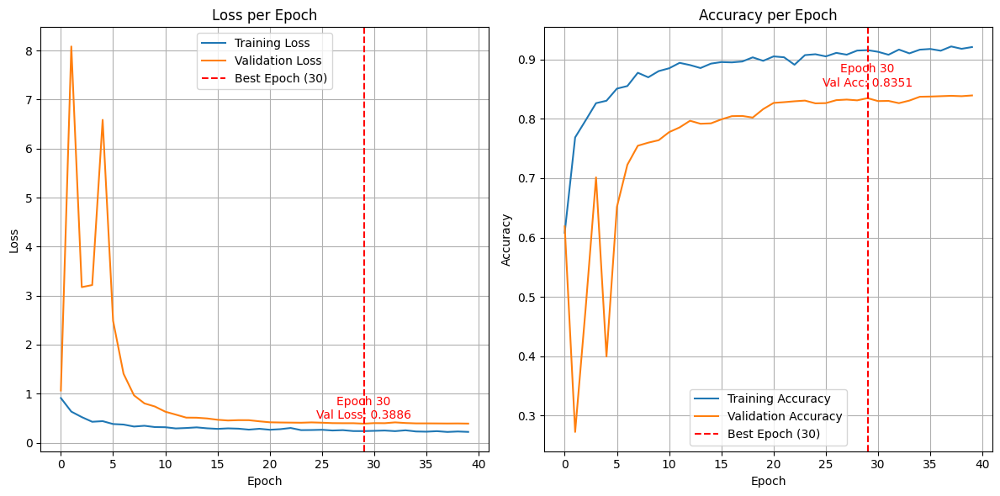

In [7]:
# Train Model
from tensorflow.keras.optimizers import Adam
import time
from datetime import datetime
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard

# Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min', restore_best_weights=False, verbose=1)

# Model Checkpoint
model_checkpoint = ModelCheckpoint( filepath='.//model//256O_B8E100_BiSeNetV3-EfficientNetB1.keras', monitor='val_loss', mode='min', save_best_only=False, verbose=1)

# Reduce Learning Rate
reduce_lr = ReduceLROnPlateau( monitor='val_loss', factor=0.1, patience=5, mode='min', min_lr=1e-6, verbose=1)

# Buat direktori log untuk TensorBoard
log_dir = "logs/fit/O-B8E100" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir,
    histogram_freq=1,
    write_graph=True,
    write_images=True
)

# # Combine all callbacks
callbacks = [early_stopping, model_checkpoint, reduce_lr, tensorboard]

# Mengukur waktu komputasi saat pelatihan
start_time = time.time()

# Kompilasi model
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

# Latih model dan simpan riwayat pelatihan
history = model.fit(X_train, y_train,
                    epochs=100,
                    batch_size=8,
                    validation_data=(X_val, y_val),
                    callbacks = callbacks)

end_time = time.time()
training_time = end_time - start_time

# Ukuran model dalam byte
model_size = model.count_params() * 4  # Menghitung ukuran model dalam byte (asumsi float32)

print(f'Waktu Komputasi untuk Pelatihan: {training_time:.2f} detik')
print(f'Ukur Model: {model_size / (1024 ** 2):.2f} MB')  # Mengonversi ke MB

# Visualisasi loss
# Menentukan epoch terbaik berdasarkan val_loss
best_epoch = history.history['val_loss'].index(min(history.history['val_loss']))
best_val_loss = history.history['val_loss'][best_epoch]

# Menentukan val_accuracy terbaik pada epoch terbaik
best_val_acc = history.history['val_accuracy'][best_epoch]

plt.figure(figsize=(12, 6))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

# Menambahkan garis vertikal pada epoch terbaik
plt.axvline(x=best_epoch, color='red', linestyle='--', label=f'Best Epoch ({best_epoch+1})')

# Menambahkan teks di atas garis vertikal
plt.text(best_epoch, best_val_loss + 0.1,  # Posisi teks sedikit di atas titik
         f'Epoch {best_epoch+1}\nVal Loss: {best_val_loss:.4f}', 
         color='red', fontsize=10, ha='center')

plt.title('Loss per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid()

# Plot akurasi
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')

# Menambahkan garis vertikal pada epoch terbaik
plt.axvline(x=best_epoch, color='red', linestyle='--', label=f'Best Epoch ({best_epoch+1})')

# Menambahkan teks di atas garis vertikal
best_val_acc = history.history['val_accuracy'][best_epoch]
plt.text(best_epoch, best_val_acc + 0.02,  # Posisi teks sedikit di atas titik
         f'Epoch {best_epoch+1}\nVal Acc: {best_val_acc:.4f}', 
         color='red', fontsize=10, ha='center')

plt.title('Accuracy per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

# Evaluasi Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


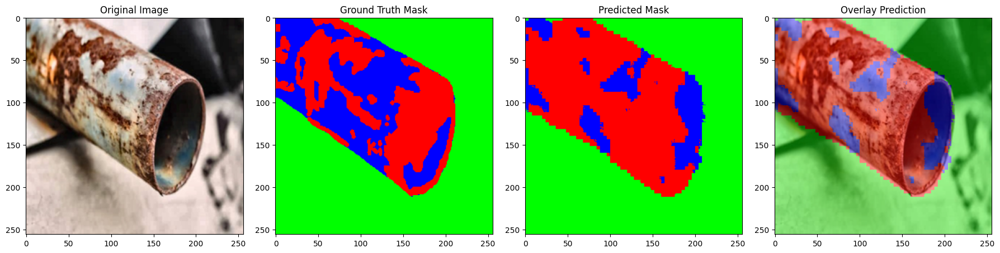

Image 1: Computation Time = 0.3807 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.6742, IoU = 0.5085
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.4421, IoU = 0.2838
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9785, IoU = 0.9580
--------------------------------------------------
Red Pixel Count (Corrosion): 22550
Blue Pixel Count (Pipe): 29361
Corrosion Percentage on Pipe: 76.80%


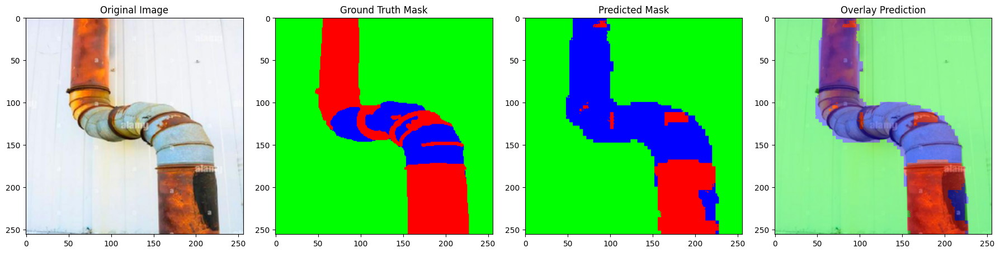

Image 2: Computation Time = 0.4206 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.5903, IoU = 0.4188
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.5460, IoU = 0.3755
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9870, IoU = 0.9743
--------------------------------------------------
Red Pixel Count (Corrosion): 5852
Blue Pixel Count (Pipe): 18913
Corrosion Percentage on Pipe: 30.94%


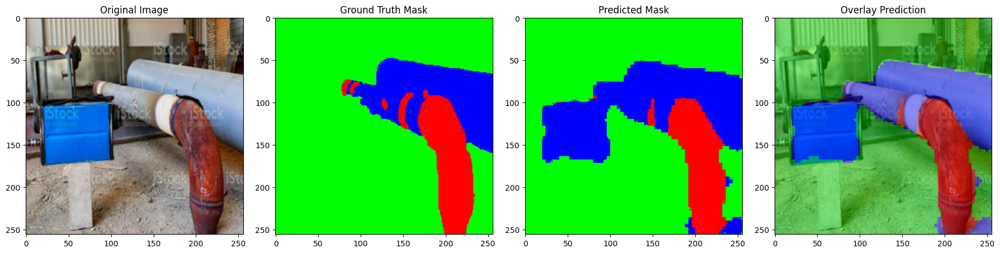

Image 3: Computation Time = 0.4727 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.9088, IoU = 0.8328
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7107, IoU = 0.5512
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9237, IoU = 0.8583
--------------------------------------------------
Red Pixel Count (Corrosion): 7047
Blue Pixel Count (Pipe): 22599
Corrosion Percentage on Pipe: 31.18%


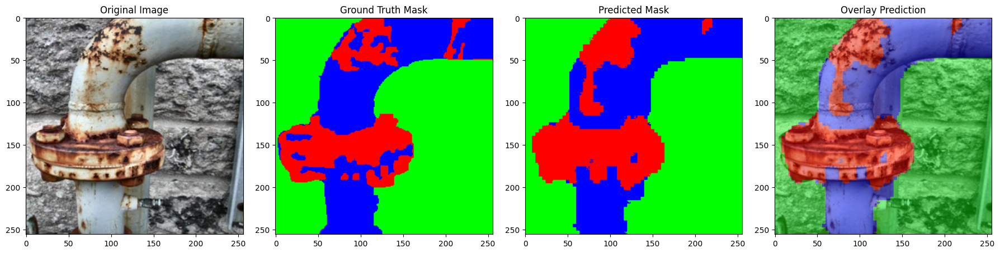

Image 4: Computation Time = 0.6010 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7890, IoU = 0.6515
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8025, IoU = 0.6702
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9590, IoU = 0.9212
--------------------------------------------------
Red Pixel Count (Corrosion): 13269
Blue Pixel Count (Pipe): 30188
Corrosion Percentage on Pipe: 43.95%


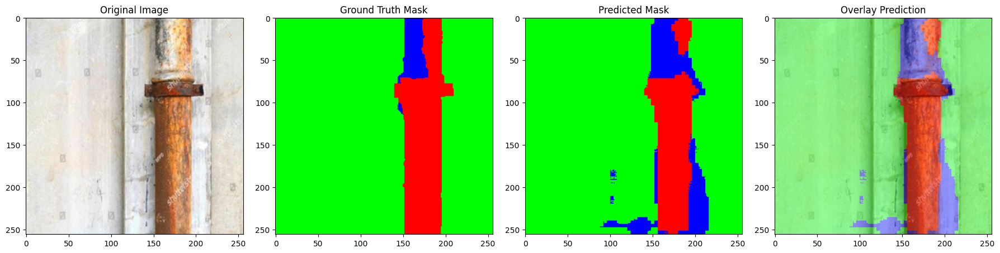

Image 5: Computation Time = 0.8696 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8945, IoU = 0.8091
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.4507, IoU = 0.2909
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9702, IoU = 0.9421
--------------------------------------------------
Red Pixel Count (Corrosion): 8301
Blue Pixel Count (Pipe): 14072
Corrosion Percentage on Pipe: 58.99%


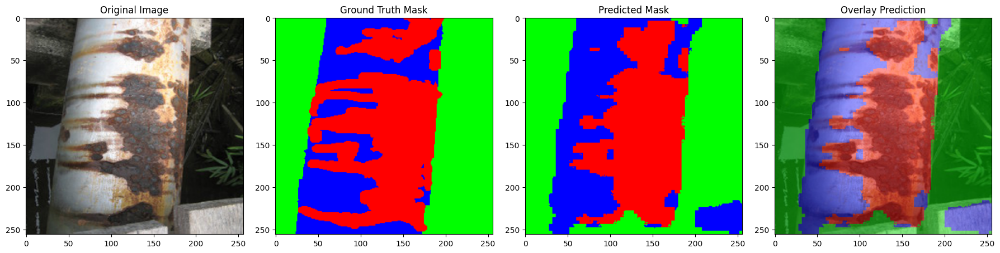

Image 6: Computation Time = 0.3727 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8151, IoU = 0.6879
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6856, IoU = 0.5216
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9173, IoU = 0.8472
--------------------------------------------------
Red Pixel Count (Corrosion): 19664
Blue Pixel Count (Pipe): 37210
Corrosion Percentage on Pipe: 52.85%


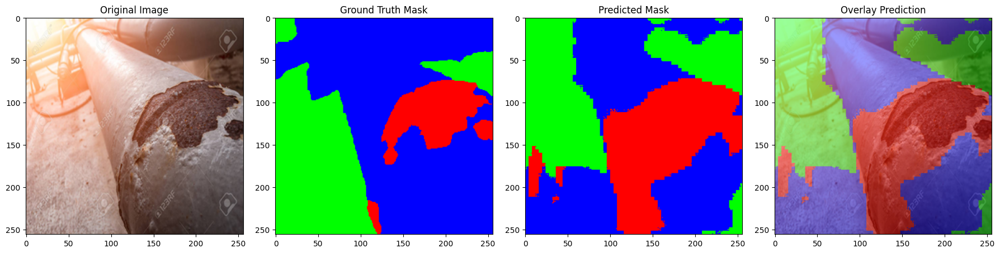

Image 7: Computation Time = 0.5561 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.5752, IoU = 0.4037
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6244, IoU = 0.4540
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.5682, IoU = 0.3969
--------------------------------------------------
Red Pixel Count (Corrosion): 17827
Blue Pixel Count (Pipe): 46176
Corrosion Percentage on Pipe: 38.61%


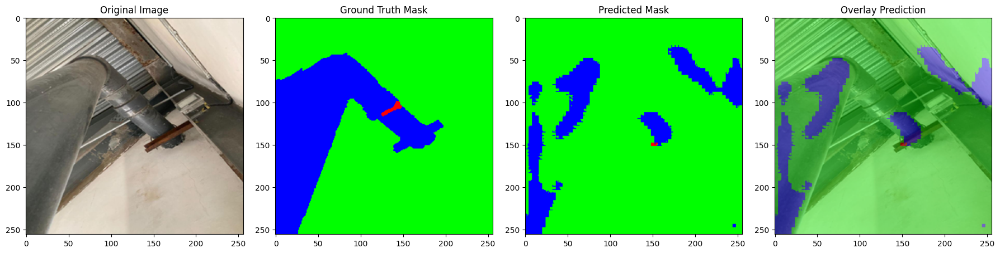

Image 8: Computation Time = 0.5361 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0000, IoU = 0.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.4987, IoU = 0.3322
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8784, IoU = 0.7832
--------------------------------------------------
Red Pixel Count (Corrosion): 28
Blue Pixel Count (Pipe): 8629
Corrosion Percentage on Pipe: 0.32%


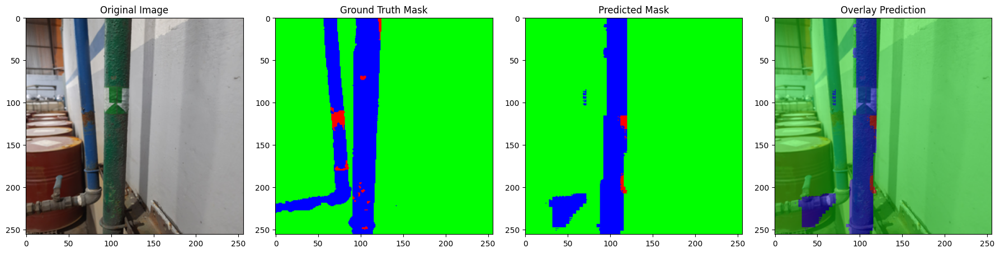

Image 9: Computation Time = 0.4358 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0000, IoU = 0.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7173, IoU = 0.5592
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9515, IoU = 0.9074
--------------------------------------------------
Red Pixel Count (Corrosion): 220
Blue Pixel Count (Pipe): 7854
Corrosion Percentage on Pipe: 2.80%


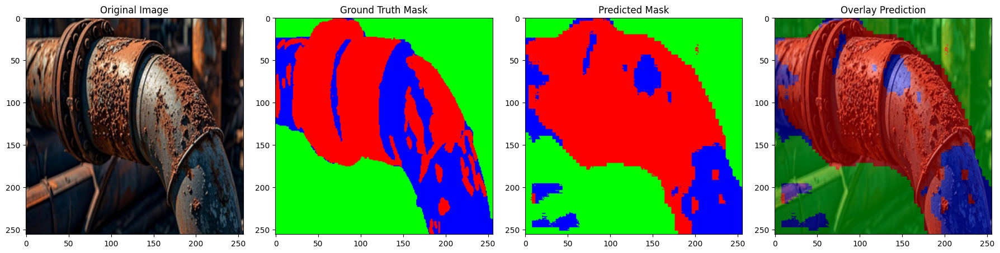

Image 10: Computation Time = 0.4080 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7891, IoU = 0.6516
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.5385, IoU = 0.3685
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9354, IoU = 0.8786
--------------------------------------------------
Red Pixel Count (Corrosion): 30188
Blue Pixel Count (Pipe): 40249
Corrosion Percentage on Pipe: 75.00%


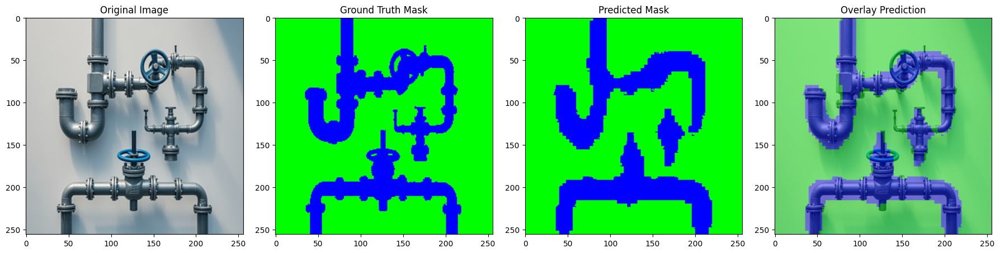

Image 11: Computation Time = 0.4332 seconds
Class 0 (Color: [255, 0, 0]): Dice = 1.0000, IoU = 1.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8413, IoU = 0.7261
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9471, IoU = 0.8995
--------------------------------------------------
Red Pixel Count (Corrosion): 0
Blue Pixel Count (Pipe): 17247
Corrosion Percentage on Pipe: 0.00%
Mean Evaluation Metrics (Across All Images):
Class 0 (Color: [255, 0, 0]): Mean Dice = 0.6396, Mean IoU = 0.5422
Class 1 (Color: [0, 0, 255]): Mean Dice = 0.6234, Mean IoU = 0.4666
Class 2 (Color: [0, 255, 0]): Mean Dice = 0.9106, Mean IoU = 0.8515
Average Computation Time per Image: 0.4988 seconds
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


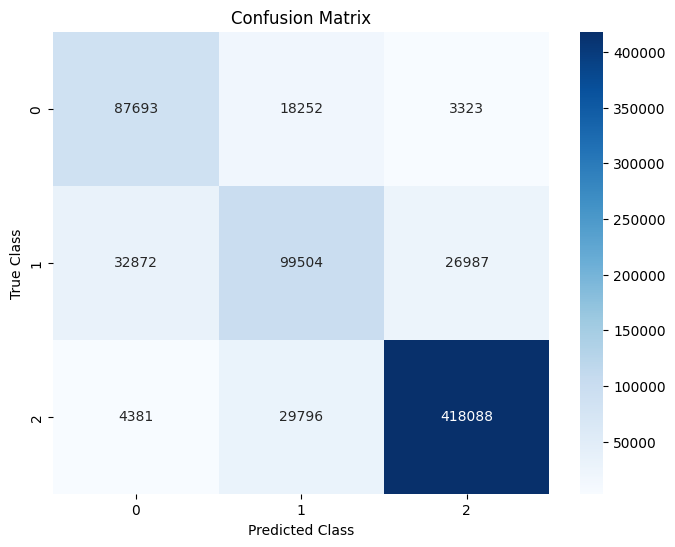

In [8]:
from sklearn.metrics import accuracy_score, confusion_matrix, jaccard_score
import seaborn as sns

# Visualisasi dengan Metriks Evaluasi
def dice_coefficient(y_true, y_pred):
    """Menghitung Dice Coefficient"""
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + 1e-7) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)

def iou_score(y_true, y_pred):
    """Menghitung IoU Score"""
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + 1e-7) / (union + 1e-7)


def convert_to_rgb(mask, colormap):
    """Konversi mask kelas ke RGB menggunakan colormap"""
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(len(colormap)):
        rgb_mask[mask == cls] = colormap[cls]
    return rgb_mask

def overlay_images(original, mask, opacity=0.5):
    """Menggabungkan gambar asli dan mask dengan efek transparansi."""
    overlay = cv2.addWeighted(original, 1 - opacity, mask, opacity, 0)
    return overlay

def evaluate_model_on_val_data(model, X_val, y_val, colormap):
    """
    Mengevaluasi model pada data val dan menampilkan hasil prediksi dengan metrik evaluasi, overlay, dan waktu komputasi.
    
    Args:
        model: Model yang telah dilatih.
        X_val: Gambar input val.
        y_val: Ground truth mask val.
        colormap: Dictionary yang berisi peta warna untuk setiap kelas.
    """
    predictions = model.predict(X_val)
    predictions_class_index = np.argmax(predictions, axis=-1)
    y_val_class_index = np.argmax(y_val, axis=-1)

    num_classes = y_val.shape[-1]
    mean_dice = np.zeros(num_classes)
    mean_iou = np.zeros(num_classes)
    
    num_samples = X_val.shape[0]  # Total sample in the val set
    computation_times = []  # List to store computation times for each prediction
    
    # Tampilkan beberapa sampel hasil prediksi
    for i in range(num_samples):
        start_time = time.time()  # Start the timer for prediction
        
        plt.figure(figsize=(18, 6))
        
        # Gambar asli
        plt.subplot(1, 4, 1)
        plt.imshow(X_val[i])
        plt.title('Original Image')

        # Ground truth mask
        plt.subplot(1, 4, 2)
        ground_truth_rgb = convert_to_rgb(y_val_class_index[i], colormap)
        plt.imshow(ground_truth_rgb)
        plt.title('Ground Truth Mask')

        # Prediksi mask
        plt.subplot(1, 4, 3)
        predicted_rgb = convert_to_rgb(predictions_class_index[i], colormap)
        plt.imshow(predicted_rgb)
        plt.title('Predicted Mask')
        
        # Overlay gambar asli dengan prediksi
        overlay = overlay_images(X_val[i], predicted_rgb, opacity=0.4)  # Ubah opacity sesuai keinginan
        plt.subplot(1, 4, 4)
        plt.imshow(overlay)
        plt.title('Overlay Prediction')
        
        plt.tight_layout()
        plt.show()

        # Hitung waktu komputasi
        end_time = time.time()
        computation_time = end_time - start_time
        computation_times.append(computation_time)  # Append computation time
        print(f"Image {i+1}: Computation Time = {computation_time:.4f} seconds")
        
        # Hitung metrik untuk setiap kelas
        for cls in range(num_classes):
            y_true_class = (y_val_class_index[i] == cls).astype(np.uint8)
            y_pred_class = (predictions_class_index[i] == cls).astype(np.uint8)

            dice = dice_coefficient(y_true_class, y_pred_class)
            iou = iou_score(y_true_class, y_pred_class)

            mean_dice[cls] += dice
            mean_iou[cls] += iou

            print(f"Class {cls} (Color: {colormap[cls]}): Dice = {dice:.4f}, IoU = {iou:.4f}")
            print("--------------------------------------------------")

        # Hitung jumlah piksel warna merah dan biru serta persentase korosi
        red_pixel_count = np.sum((predicted_rgb == [255, 0, 0]).all(axis=-1))
        blue_pixel = np.sum((predicted_rgb == [0, 0, 255]).all(axis=-1))
        blue_pixel_count = red_pixel_count + blue_pixel
        corrosion_percentage = (red_pixel_count / blue_pixel_count) * 100 if blue_pixel_count > 0 else 0
    
        # Tampilkan hasil
        print(f"Red Pixel Count (Corrosion): {red_pixel_count}")
        print(f"Blue Pixel Count (Pipe): {blue_pixel_count}")
        print(f"Corrosion Percentage on Pipe: {corrosion_percentage:.2f}%")
        print("=======================================")       

    # Hitung rata-rata metrik
    mean_dice /= num_samples
    mean_iou /= num_samples

    print("Mean Evaluation Metrics (Across All Images):")
    for cls in range(num_classes):
        print(f"Class {cls} (Color: {colormap[cls]}): Mean Dice = {mean_dice[cls]:.4f}, Mean IoU = {mean_iou[cls]:.4f}")
    print("==================================================")
    
    # Hitung dan tampilkan rata-rata waktu komputasi
    avg_computation_time = np.mean(computation_times)
    print(f"Average Computation Time per Image: {avg_computation_time:.4f} seconds")

# Fungsi untuk menghitung Confusion Matrix
def calculate_confusion_matrix(y_true, y_pred):
    """Menghitung confusion matrix untuk setiap kelas."""
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten())
    return cm

# Load data val
X_val_images, y_val_masks, y_val_one_hot_masks = load_and_one_hot_encode(val_original_dir, val_mask_dir, target_size)

# Konversi val data ke format yang sesuai untuk evaluasi
y_val_class_index = np.argmax(y_val_one_hot_masks, axis=-1)

# Evaluasi model pada data val
evaluate_model_on_val_data(model, X_val_images, y_val_one_hot_masks, colormap)

# Hitung confusion matrix
y_val_pred_class_index = np.argmax(model.predict(X_val_images), axis=-1)
cm = calculate_confusion_matrix(y_val_class_index, y_val_pred_class_index)

# Visualisasi confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

# Save Model

In [9]:
import pathlib
import tensorflow as tf
export_dir = 'model/256O_B8E100_BiSeNetV3-EfficientNetB1'
tf.saved_model.save(model, export_dir)

INFO:tensorflow:Assets written to: model/256O_B8E100_BiSeNetV3-EfficientNetB1\assets


INFO:tensorflow:Assets written to: model/256O_B8E100_BiSeNetV3-EfficientNetB1\assets


In [10]:
# Convert the model.
converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)
tflite_model = converter.convert()

In [11]:
tflite_model_file = pathlib.Path('256O_B8E100_BiSeNetV3-EfficientNetB1.tflite')
tflite_model_file.write_bytes(tflite_model)

336872

# Load Model & Predict Test

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


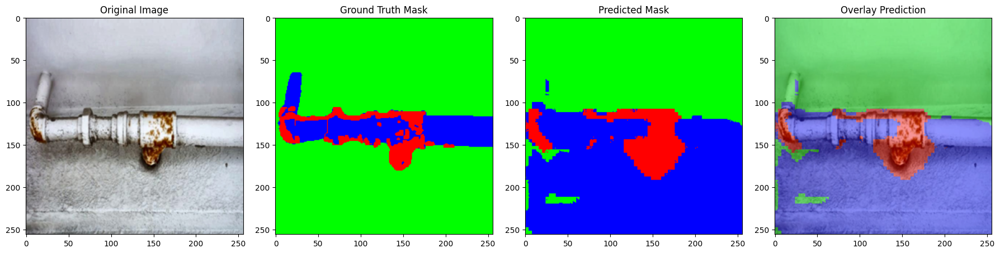

Image 1: Computation Time = 0.3576 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.6286, IoU = 0.4583
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.2866, IoU = 0.1673
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.6813, IoU = 0.5166
--------------------------------------------------
Red Pixel Count (Corrosion): 5322
Blue Pixel Count (Pipe): 35915
Corrosion Percentage on Pipe: 14.82%


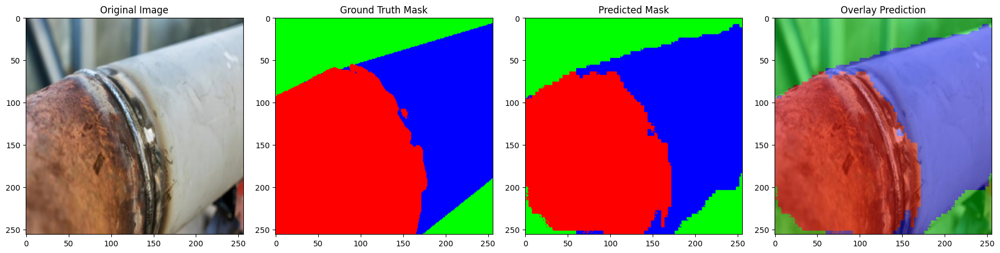

Image 2: Computation Time = 0.3463 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.9493, IoU = 0.9034
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.9352, IoU = 0.8783
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9367, IoU = 0.8809
--------------------------------------------------
Red Pixel Count (Corrosion): 27200
Blue Pixel Count (Pipe): 50207
Corrosion Percentage on Pipe: 54.18%


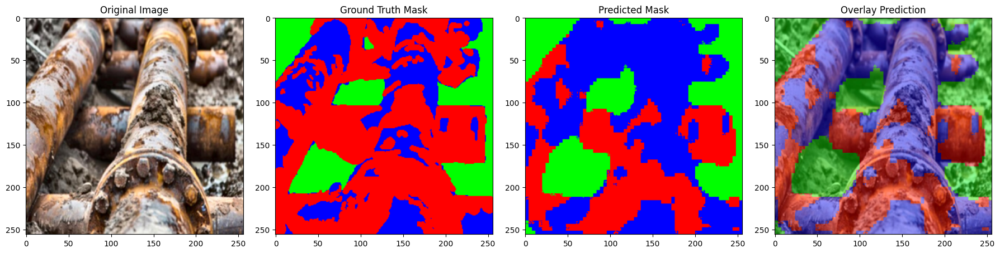

Image 3: Computation Time = 0.3471 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.6324, IoU = 0.4625
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.5743, IoU = 0.4029
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8192, IoU = 0.6937
--------------------------------------------------
Red Pixel Count (Corrosion): 19839
Blue Pixel Count (Pipe): 48898
Corrosion Percentage on Pipe: 40.57%


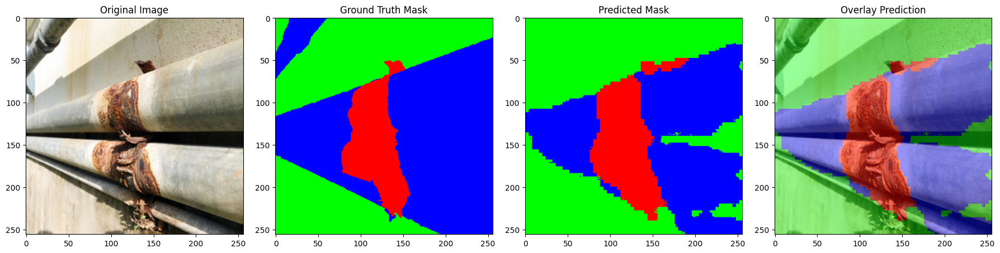

Image 4: Computation Time = 0.3523 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.8768, IoU = 0.7807
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8610, IoU = 0.7559
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8772, IoU = 0.7813
--------------------------------------------------
Red Pixel Count (Corrosion): 9457
Blue Pixel Count (Pipe): 34834
Corrosion Percentage on Pipe: 27.15%


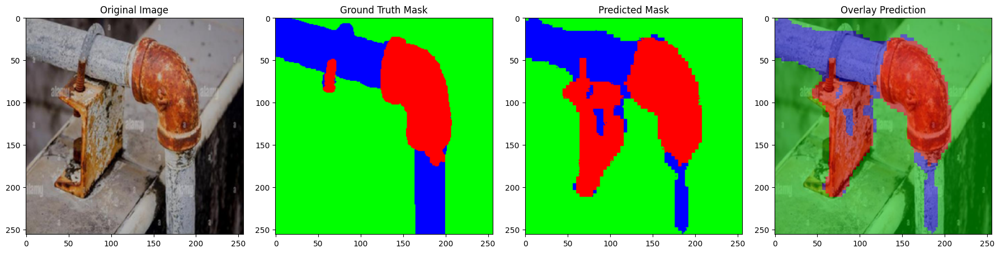

Image 5: Computation Time = 0.4317 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7146, IoU = 0.5560
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8000, IoU = 0.6666
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.8952, IoU = 0.8102
--------------------------------------------------
Red Pixel Count (Corrosion): 14358
Blue Pixel Count (Pipe): 22992
Corrosion Percentage on Pipe: 62.45%


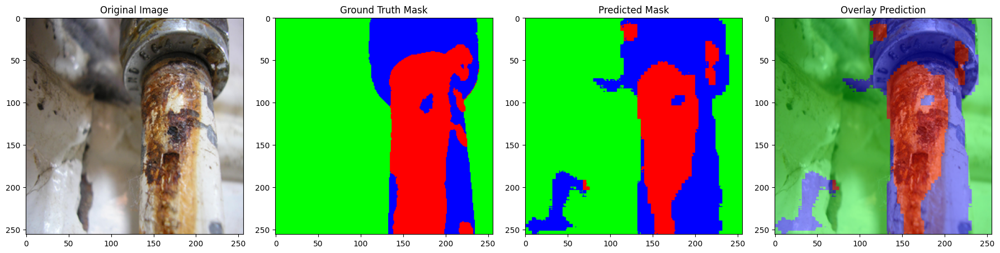

Image 6: Computation Time = 0.3578 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.7839, IoU = 0.6446
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7071, IoU = 0.5469
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9540, IoU = 0.9121
--------------------------------------------------
Red Pixel Count (Corrosion): 11137
Blue Pixel Count (Pipe): 28750
Corrosion Percentage on Pipe: 38.74%


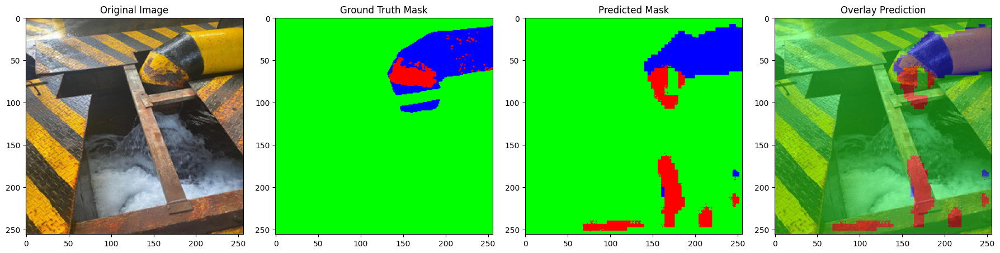

Image 7: Computation Time = 0.3611 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.2148, IoU = 0.1203
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8152, IoU = 0.6880
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9595, IoU = 0.9221
--------------------------------------------------
Red Pixel Count (Corrosion): 3761
Blue Pixel Count (Pipe): 8809
Corrosion Percentage on Pipe: 42.69%


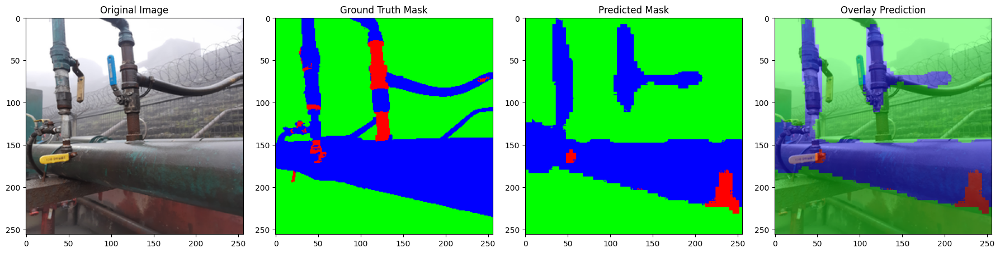

Image 8: Computation Time = 0.3640 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0492, IoU = 0.0252
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.7867, IoU = 0.6483
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9169, IoU = 0.8466
--------------------------------------------------
Red Pixel Count (Corrosion): 1144
Blue Pixel Count (Pipe): 21010
Corrosion Percentage on Pipe: 5.45%


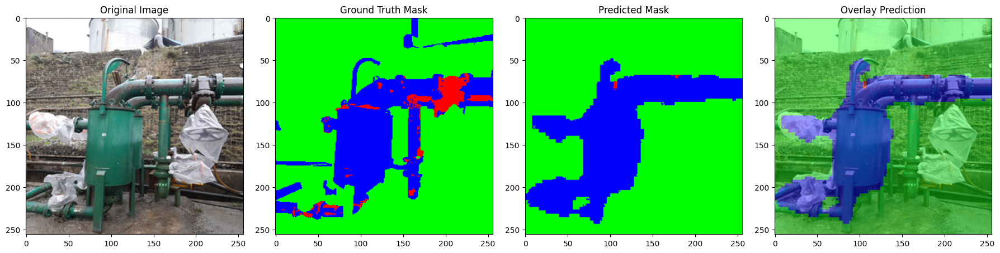

Image 9: Computation Time = 0.3553 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0000, IoU = 0.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.6820, IoU = 0.5174
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9041, IoU = 0.8250
--------------------------------------------------
Red Pixel Count (Corrosion): 57
Blue Pixel Count (Pipe): 16893
Corrosion Percentage on Pipe: 0.34%


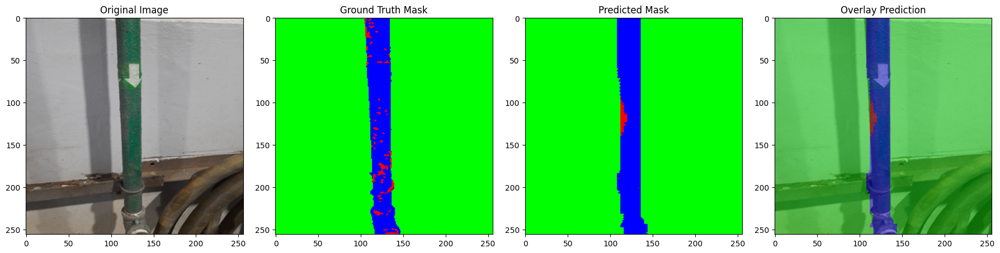

Image 10: Computation Time = 0.4179 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.0147, IoU = 0.0074
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8958, IoU = 0.8112
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9942, IoU = 0.9884
--------------------------------------------------
Red Pixel Count (Corrosion): 206
Blue Pixel Count (Pipe): 6578
Corrosion Percentage on Pipe: 3.13%


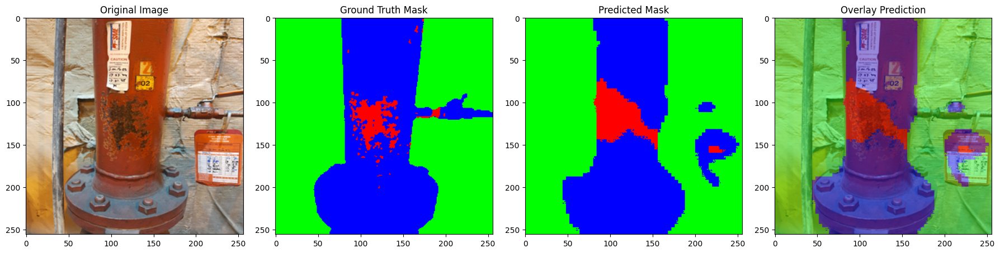

Image 11: Computation Time = 0.3529 seconds
Class 0 (Color: [255, 0, 0]): Dice = 0.5437, IoU = 0.3734
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.8637, IoU = 0.7601
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9398, IoU = 0.8864
--------------------------------------------------
Red Pixel Count (Corrosion): 3204
Blue Pixel Count (Pipe): 26468
Corrosion Percentage on Pipe: 12.11%


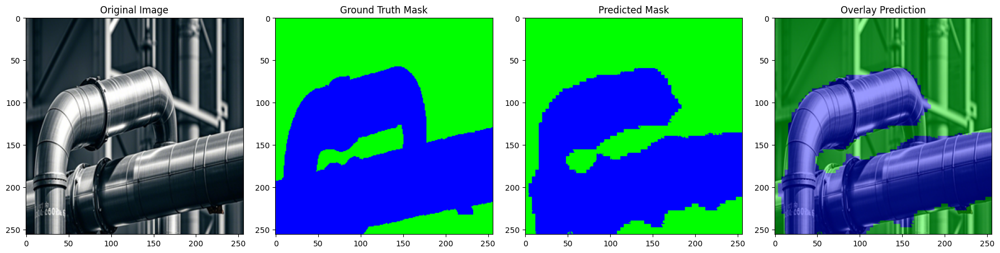

Image 12: Computation Time = 0.3658 seconds
Class 0 (Color: [255, 0, 0]): Dice = 1.0000, IoU = 1.0000
--------------------------------------------------
Class 1 (Color: [0, 0, 255]): Dice = 0.9519, IoU = 0.9082
--------------------------------------------------
Class 2 (Color: [0, 255, 0]): Dice = 0.9509, IoU = 0.9063
--------------------------------------------------
Red Pixel Count (Corrosion): 0
Blue Pixel Count (Pipe): 32299
Corrosion Percentage on Pipe: 0.00%
Mean Evaluation Metrics (Across All Images):
Class 0 (Color: [255, 0, 0]): Mean Dice = 0.5340, Mean IoU = 0.4443
Class 1 (Color: [0, 0, 255]): Mean Dice = 0.7633, Mean IoU = 0.6459
Class 2 (Color: [0, 255, 0]): Mean Dice = 0.9024, Mean IoU = 0.8308
Average Computation Time per Image: 0.3675 seconds
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


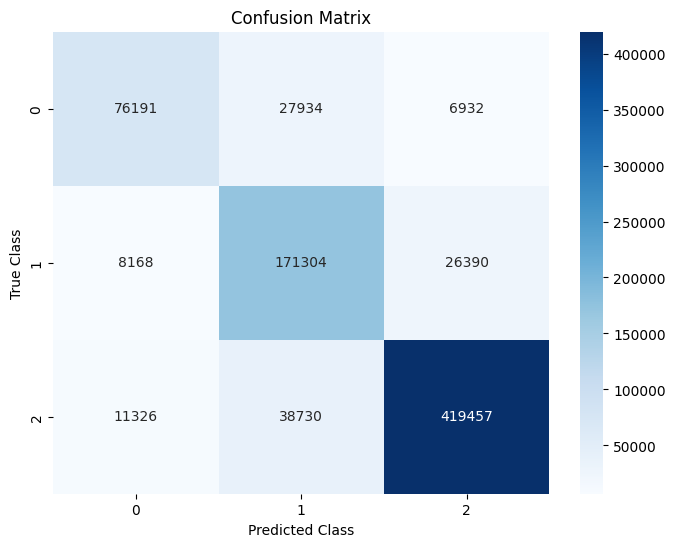

In [12]:
from keras.models import load_model
import re
from sklearn.metrics import accuracy_score, confusion_matrix, jaccard_score
import seaborn as sns

# Model
model_path = 'C:\\Users\\Admin\\Documents\\Model\\BiSeNetV3\\model\\256O_B8E100_BiSeNetV3-EfficientNetB1.keras'
model = load_model(model_path)

# Visualisasi dengan Metriks Evaluasi
def dice_coefficient(y_true, y_pred):
    """Menghitung Dice Coefficient"""
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + 1e-7) / (np.sum(y_true) + np.sum(y_pred) + 1e-7)

def iou_score(y_true, y_pred):
    """Menghitung IoU Score"""
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred) - intersection
    return (intersection + 1e-7) / (union + 1e-7)

def convert_to_rgb(mask, colormap):
    """Konversi mask kelas ke RGB menggunakan colormap"""
    h, w = mask.shape
    rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
    for cls in range(len(colormap)):
        rgb_mask[mask == cls] = colormap[cls]
    return rgb_mask

def overlay_images(original, mask, opacity=0.5):
    """Menggabungkan gambar asli dan mask dengan efek transparansi."""
    overlay = cv2.addWeighted(original, 1 - opacity, mask, opacity, 0)
    return overlay

def evaluate_model_on_test_data(model, X, y_test, colormap):
    """
    Mengevaluasi model pada data val dan menampilkan hasil prediksi dengan metrik evaluasi, overlay, dan waktu komputasi.
    
    Args:
        model: Model yang telah dilatih.
        X: Gambar input val.
        y_test: Ground truth mask val.
        colormap: Dictionary yang berisi peta warna untuk setiap kelas.
    """
    predictions = model.predict(X)
    predictions_class_index = np.argmax(predictions, axis=-1)
    y_test_class_index = np.argmax(y_test, axis=-1)

    num_classes = y_test.shape[-1]
    mean_dice = np.zeros(num_classes)
    mean_iou = np.zeros(num_classes)
    
    num_samples = X.shape[0]  # Total sample in the val set
    computation_times = []  # List to store computation times for each prediction
    
    # Tampilkan beberapa sampel hasil prediksi
    for i in range(num_samples):
        start_time = time.time()  # Start the timer for prediction
        
        plt.figure(figsize=(18, 6))
        
        # Gambar asli
        plt.subplot(1, 4, 1)
        plt.imshow(X[i])
        plt.title('Original Image')

        # Ground truth mask
        plt.subplot(1, 4, 2)
        ground_truth_rgb = convert_to_rgb(y_test_class_index[i], colormap)
        plt.imshow(ground_truth_rgb)
        plt.title('Ground Truth Mask')

        # Prediksi mask
        plt.subplot(1, 4, 3)
        predicted_rgb = convert_to_rgb(predictions_class_index[i], colormap)
        plt.imshow(predicted_rgb)
        plt.title('Predicted Mask')
        
        # Overlay gambar asli dengan prediksi
        overlay = overlay_images(X[i], predicted_rgb, opacity=0.4)  # Ubah opacity sesuai keinginan
        plt.subplot(1, 4, 4)
        plt.imshow(overlay)
        plt.title('Overlay Prediction')
        
        plt.tight_layout()
        plt.show()

        # Hitung waktu komputasi
        end_time = time.time()
        computation_time = end_time - start_time
        computation_times.append(computation_time)  # Append computation time
        print(f"Image {i+1}: Computation Time = {computation_time:.4f} seconds")
        
        # Hitung metrik untuk setiap kelas
        for cls in range(num_classes):
            y_true_class = (y_test_class_index[i] == cls).astype(np.uint8)
            y_pred_class = (predictions_class_index[i] == cls).astype(np.uint8)

            dice = dice_coefficient(y_true_class, y_pred_class)
            iou = iou_score(y_true_class, y_pred_class)

            mean_dice[cls] += dice
            mean_iou[cls] += iou

            print(f"Class {cls} (Color: {colormap[cls]}): Dice = {dice:.4f}, IoU = {iou:.4f}")
            print("--------------------------------------------------")

        # Hitung jumlah piksel warna merah dan biru serta persentase korosi
        red_pixel_count = np.sum((predicted_rgb == [255, 0, 0]).all(axis=-1))
        blue_pixel = np.sum((predicted_rgb == [0, 0, 255]).all(axis=-1))
        blue_pixel_count = red_pixel_count + blue_pixel
        corrosion_percentage = (red_pixel_count / blue_pixel_count) * 100 if blue_pixel_count > 0 else 0
    
        # Tampilkan hasil
        print(f"Red Pixel Count (Corrosion): {red_pixel_count}")
        print(f"Blue Pixel Count (Pipe): {blue_pixel_count}")
        print(f"Corrosion Percentage on Pipe: {corrosion_percentage:.2f}%")
        print("=======================================")             

    # Hitung rata-rata metrik
    mean_dice /= num_samples
    mean_iou /= num_samples

    print("Mean Evaluation Metrics (Across All Images):")
    for cls in range(num_classes):
        print(f"Class {cls} (Color: {colormap[cls]}): Mean Dice = {mean_dice[cls]:.4f}, Mean IoU = {mean_iou[cls]:.4f}")
    print("==================================================")
    
    # Hitung dan tampilkan rata-rata waktu komputasi
    avg_computation_time = np.mean(computation_times)
    print(f"Average Computation Time per Image: {avg_computation_time:.4f} seconds")

# Fungsi untuk menghitung Confusion Matrix
def calculate_confusion_matrix(y_true, y_pred):
    """Menghitung confusion matrix untuk setiap kelas."""
    cm = confusion_matrix(y_true.flatten(), y_pred.flatten())
    return cm

# Load data val
X_test_images, y_test_masks, y_test_one_hot_masks = load_and_one_hot_encode(test_original_dir, test_mask_dir, target_size)

# Konversi test data ke format yang sesuai untuk evaluasi
y_test_class_index = np.argmax(y_test_one_hot_masks, axis=-1)

# Evaluasi model pada data val
evaluate_model_on_test_data(model, X_test_images, y_test_one_hot_masks, colormap)

# Hitung confusion matrix
y_test_pred_class_index = np.argmax(model.predict(X_test_images), axis=-1)
cm = calculate_confusion_matrix(y_test_class_index, y_test_pred_class_index)

# Visualisasi confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Metrics for Image 1
   Image Index  Class  Intersection  Union       IoU  Dice Numerator  \
0            1      0          2809   6129  0.458313            5618   
1            1      1          5396  32259  0.167271           10792   
2            1      2         28776  55703  0.516597           57552   

   Dice Denominator  Dice Coefficient  
0              8938          0.628552  
1             37655          0.286602  
2             84479          0.681258  
--------------------------------------------------
Metrics for Image 2
   Image Index  Class  Intersection  Union       IoU  Dice Numerator  \
0            2      0         27132  30032  0.903436           54264   
1            2      1         20625  23482  0.878332           41250   
2            2      2         13957  15844  0.880901           27914   

   Dice Denominator  Dice Coefficient  
0             57164          0.949269  
1             44107          0.935226  
2             2

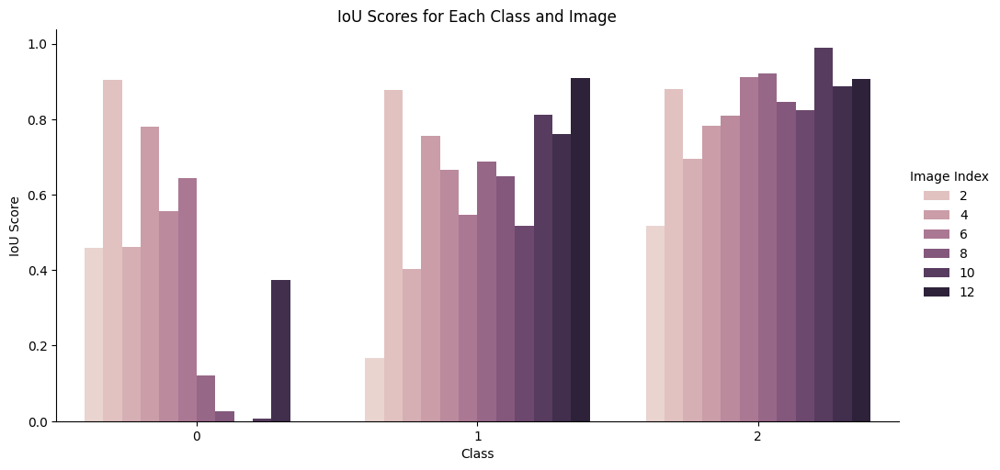

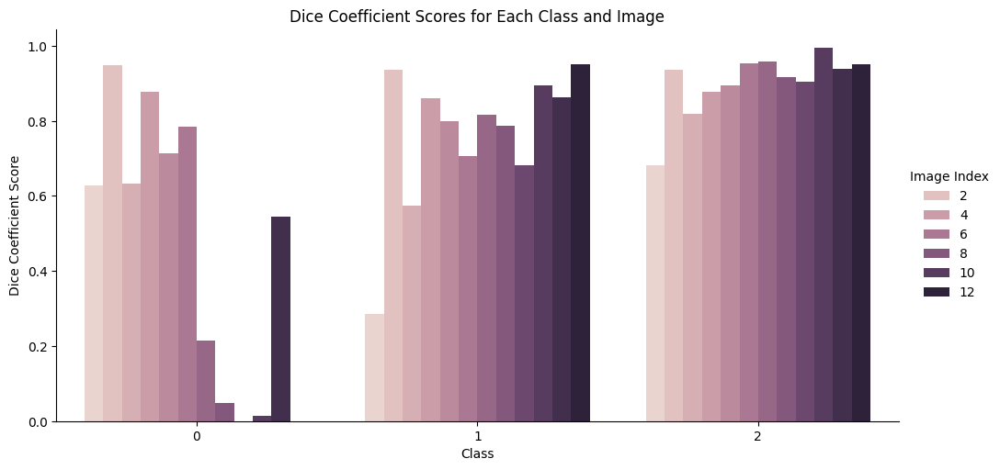

In [13]:
import numpy as np
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Function to calculate IoU and Dice Coefficient
def calculate_metrics(y_true, y_pred, num_classes=3):
    """Calculate IoU and Dice Coefficient for each class."""
    results = []
    
    for class_idx in range(num_classes):
        intersection = np.logical_and(y_true == class_idx, y_pred == class_idx).sum()
        union = np.logical_or(y_true == class_idx, y_pred == class_idx).sum()
        dice_numerator = 2 * intersection
        dice_denominator = (y_true == class_idx).sum() + (y_pred == class_idx).sum()
        
        iou = intersection / union if union != 0 else 0.0
        dice = dice_numerator / dice_denominator if dice_denominator != 0 else 0.0
        
        results.append({
            "Class": class_idx,
            "Intersection": intersection,
            "Union": union,
            "IoU": iou,
            "Dice Numerator": dice_numerator,
            "Dice Denominator": dice_denominator,
            "Dice Coefficient": dice
        })
    
    return pd.DataFrame(results)

# Evaluate model on test images
y_test_pred_class_index = np.argmax(model.predict(X_test_images), axis=-1)

# Calculate metrics for each image
all_metrics = []
for i in range(len(X_test_images)):
    metrics_df = calculate_metrics(y_test_class_index[i], y_test_pred_class_index[i])
    metrics_df.insert(0, "Image Index", i+1)  # Add image index
    all_metrics.append(metrics_df)
    
    # Display each image's metrics in table format
    print(f"Metrics for Image {i+1}")
    print(metrics_df)
    print("-" * 50)

# Combine all results into a single DataFrame
total_metrics_df = pd.concat(all_metrics, ignore_index=True)

# Visualizing metrics
g = sns.catplot(data=total_metrics_df, x="Class", y="IoU", hue="Image Index", kind="bar", height=5, aspect=2)
g.set_axis_labels("Class", "IoU Score")
plt.title("IoU Scores for Each Class and Image")
plt.show()

g = sns.catplot(data=total_metrics_df, x="Class", y="Dice Coefficient", hue="Image Index", kind="bar", height=5, aspect=2)
g.set_axis_labels("Class", "Dice Coefficient Score")
plt.title("Dice Coefficient Scores for Each Class and Image")
plt.show()